# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [3]:
import torch.nn as nn
import torchvision.models as models
from torchsummary import summary

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Conv2D, BatchNormalization, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from torchvision import transforms
import torch
import torch.nn as nn
import torchvision.models as models


from PIL import Image
import os

from tqdm import tqdm
from tqdm import notebook

import nltk
from nltk.corpus import stopwords as nltk_stopwords
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer

import re

from sklearn.model_selection import GroupShuffleSplit

import os
import matplotlib.pyplot as plt

In [4]:
from sklearn.pipeline import Pipeline

from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVR
from sklearn.preprocessing import  StandardScaler

from transformers import BertTokenizer, BertModel

import warnings

from sklearn.linear_model import LinearRegression
import catboost
from sklearn.metrics import mean_squared_error

import warnings


C:\Users\Igor\anaconda3\Lib\site-packages\transformers\utils\generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
C:\Users\Igor\anaconda3\Lib\site-packages\transformers\utils\generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


In [5]:
warnings.filterwarnings('ignore')

In [6]:
path = r'C:\Users\Igor\Downloads\dsplus_integrated_project_4\to_upload'

In [7]:
CrowdAnnotations = pd.read_csv(path + '\\CrowdAnnotations.tsv',sep='\t', 
                               header = None, names=['image', 'query_id', 'result', 'Yes', 'No'])
CrowdAnnotations.head()

,image,query_id,result,Yes,No
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [8]:
CrowdAnnotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   result    47830 non-null  float64
 3   Yes       47830 non-null  int64  
 4   No        47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [9]:
ExpertAnnotations = pd.read_csv(path + '\\ExpertAnnotations.tsv',sep='\t', 
                               header = None, names=['image', 'query_id', 'Exp1', 'Exp2', 'Exp3'])
ExpertAnnotations.head()

,image,query_id,Exp1,Exp2,Exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [10]:
ExpertAnnotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   Exp1      5822 non-null   int64 
 3   Exp2      5822 non-null   int64 
 4   Exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


Количество оценок краудсорса гораздо выше количества оценок экспертов, при этом оценки экспертов должны быть более точны, т.к. имеют некоторую градацию, тогда как оценки краудсорса имеют бинарную природу.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

Тогда переложим их градации в шкалу от 0 до 1, где
1 балл = 0
2 балла = 0,25
3 балла = 0,75
4 балла = 1

И определим средний балл в шкале от 0 до 1 от торех экспертов

In [13]:
def condition(x):
    if x==1:
        return 0
    elif x==2:
        return 0.25
    elif x==3:
        return 0.75
    else:
        return 1

ExpertAnnotations['Exp1'] = ExpertAnnotations['Exp1'].apply(condition)
ExpertAnnotations['Exp2'] = ExpertAnnotations['Exp2'].apply(condition)
ExpertAnnotations['Exp3'] = ExpertAnnotations['Exp3'].apply(condition)

In [14]:
ExpertAnnotations['result'] = (ExpertAnnotations['Exp1']+ExpertAnnotations['Exp2']+ExpertAnnotations['Exp3'])/3

In [15]:
ExpertAnnotations.head()

,image,query_id,Exp1,Exp2,Exp3,result
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.00,0.00,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.00,0.25,0.083333
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.00,0.25,0.083333
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.25,0.25,0.166667
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.00,0.25,0.083333


Соединяем экспертные и не экаспертный оценки и выводим итоговую. При этом за основу будем брать именно оценку экспертов ввиду их лучшего качества

In [17]:
Annotations = pd.merge(ExpertAnnotations, CrowdAnnotations, on=['image', 'query_id'], how='left')

In [18]:
Annotations.head()

,image,query_id,Exp1,Exp2,Exp3,result_x,result_y,Yes,No
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.00,0.00,0.000000,0.0,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.00,0.25,0.083333,0.0,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.00,0.25,0.083333,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.25,0.25,0.166667,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.00,0.25,0.083333,NaN,NaN,NaN


In [19]:
Annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5822 non-null   object 
 1   query_id  5822 non-null   object 
 2   Exp1      5822 non-null   float64
 3   Exp2      5822 non-null   float64
 4   Exp3      5822 non-null   float64
 5   result_x  5822 non-null   float64
 6   result_y  2329 non-null   float64
 7   Yes       2329 non-null   float64
 8   No        2329 non-null   float64
dtypes: float64(7), object(2)
memory usage: 409.5+ KB


In [20]:
Annotations.loc[Annotations['result_y'].isna(), ['result_y']] = Annotations['result_x']
Annotations.head()

,image,query_id,Exp1,Exp2,Exp3,result_x,result_y,Yes,No
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.00,0.00,0.000000,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.00,0.25,0.083333,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.00,0.25,0.083333,0.083333,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.25,0.25,0.166667,0.166667,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.00,0.25,0.083333,0.083333,NaN,NaN


In [21]:
Annotations['itog'] = Annotations['result_x'] * 0.6 + Annotations['result_y'] * 0.4
Annotations.head()

,image,query_id,Exp1,Exp2,Exp3,result_x,result_y,Yes,No,itog
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.00,0.00,0.000000,0.000000,0.0,3.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.00,0.25,0.083333,0.000000,0.0,3.0,0.050000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.00,0.25,0.083333,0.083333,NaN,NaN,0.083333
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.25,0.25,0.166667,0.166667,NaN,NaN,0.166667
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.00,0.25,0.083333,0.083333,NaN,NaN,0.083333


In [22]:
Annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5822 non-null   object 
 1   query_id  5822 non-null   object 
 2   Exp1      5822 non-null   float64
 3   Exp2      5822 non-null   float64
 4   Exp3      5822 non-null   float64
 5   result_x  5822 non-null   float64
 6   result_y  5822 non-null   float64
 7   Yes       2329 non-null   float64
 8   No        2329 non-null   float64
 9   itog      5822 non-null   float64
dtypes: float64(8), object(2)
memory usage: 455.0+ KB


In [23]:
Annotations = Annotations[['image','query_id', 'itog']]
Annotations.head()

,image,query_id,itog
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.050000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.083333
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.166667
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.083333


In [24]:
Annotations.describe()

,itog
count,5822.000000
mean,0.169842
std,0.251709
min,0.000000
25%,0.000000
50%,0.083333
75%,0.200000
max,1.000000


Соответствие фотографий описанию запроса как правило низкое

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Перечень слов исключений

In [28]:
exclude_words = [
'child',
'kid',
'baby',
'children',
'boy',
'girl',
'kids',
'babies',
'boys',
'girls'
]

In [29]:
train_dataset = pd.read_csv(path +'\\train_dataset.csv')
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [30]:
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [31]:
train_dataset.duplicated().sum()

0

In [32]:
train_dataset = train_dataset.loc[~train_dataset['query_text'].str.contains('|'.join(exclude_words))].reset_index(drop = True)

In [33]:
train_dataset = pd.merge(train_dataset, Annotations, on=['image', 'query_id'], how='left')
train_dataset.head()

,image,query_id,query_text,itog
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.083333
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.166667
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.150000
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.166667
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.083333


In [34]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4334 entries, 0 to 4333
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4334 non-null   object 
 1   query_id    4334 non-null   object 
 2   query_text  4334 non-null   object 
 3   itog        4334 non-null   float64
dtypes: float64(1), object(3)
memory usage: 135.6+ KB


In [35]:
len(train_dataset['image'].unique())

995

При 4334 оценках всего 995 уникальных фотографий

In [37]:
test_dataset = pd.read_csv(path + '\\test_queries.csv', sep='|')
test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


In [38]:
test_dataset.head()

,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [39]:
len(test_dataset['image'].unique())

100

При 500 оценках всего 100 уникальных фотографий

Посмотрим в целом насколько релевантно описание содержимому фото в обучающей выборке

In [42]:
df_bad = train_dataset.loc[train_dataset['itog']<0.5]
df_bad = df_bad.sample(5)
df_bad = df_bad.reset_index(drop = True)
df_bad

,image,query_id,query_text,itog
0,2918769188_565dd48060.jpg,2289068031_fe26990183.jpg#2,A person is jumping a motorcycle over a pole w...,0.083333
1,3540416981_4e74f08cbb.jpg,2763044275_aa498eb88b.jpg#2,Five black dogs running across the grass .,0.250000
2,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.200000
3,3154641421_d1b9b8c24c.jpg,3610683688_bbe6d725ed.jpg#2,A dog wading into the water,0.000000
4,3639967449_137f48b43d.jpg,3514179514_cbc3371b92.jpg#2,A baseman tries to catch a ball while a runner...,0.000000


A person is jumping a motorcycle over a pole while camera men film .
0.08333333333333333


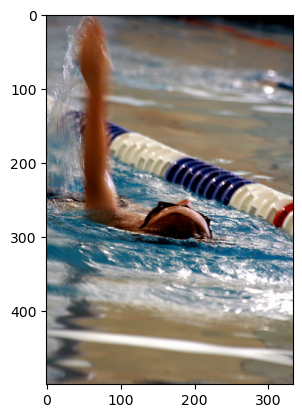

Five black dogs running across the grass .
0.25


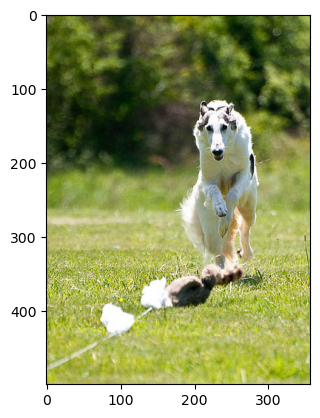

Chinese market street in the winter time .
0.19999999999999998


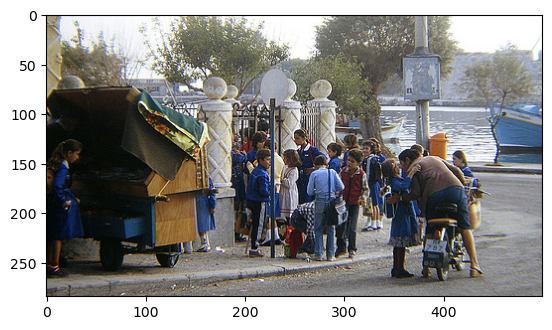

A dog wading into the water
0.0


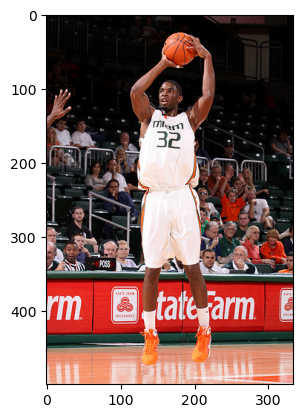

A baseman tries to catch a ball while a runner tries to make the base in a community game .
0.0


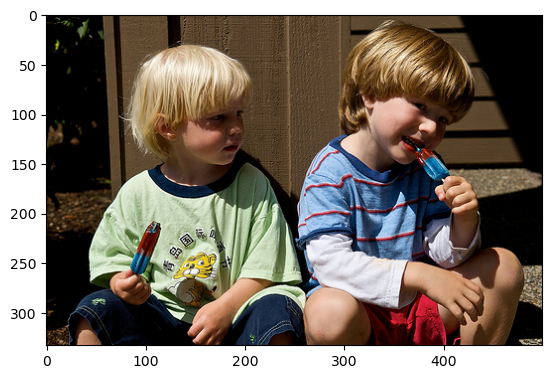

In [43]:
for i in range(len(df_bad)):
    print(df_bad.loc[i,'query_text'])
    print(df_bad.loc[i,'itog'])
    plt.imshow(Image.open(path + '\\train_images\\' + df_bad.loc[i,'image']).convert('RGB'))
    plt.show()

In [44]:
df_good = train_dataset.loc[train_dataset['itog']==1]
df_good = df_good.sample(5)
df_good = df_good.reset_index(drop = True)
df_good

,image,query_id,query_text,itog
0,3718964174_cb2dc1615e.jpg,3718964174_cb2dc1615e.jpg#2,A woman is wearing a blue headscarf and a blue...,1.0
1,2541104331_a2d65cfa54.jpg,1772859261_236c09b861.jpg#2,A dog splashes through the water .,1.0
2,2340206885_58754a799a.jpg,2340206885_58754a799a.jpg#2,Three dogs in the snow .,1.0
3,2968182121_b3b491df85.jpg,2518508760_68d8df7365.jpg#2,A greyhound wearing a muzzle and the number si...,1.0
4,537559285_29be110134.jpg,3514019869_7de4ece2a5.jpg#2,A dog jumps over an obstacle .,1.0


A woman is wearing a blue headscarf and a blue sweater .
1.0


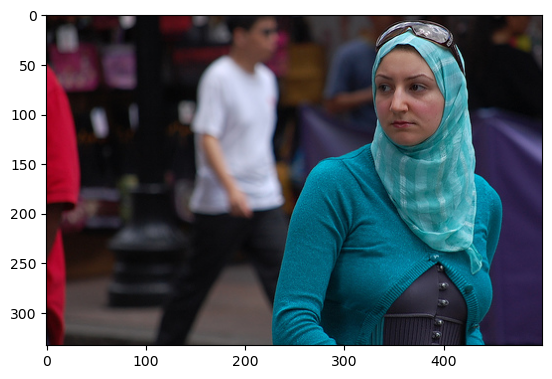

A dog splashes through the water .
1.0


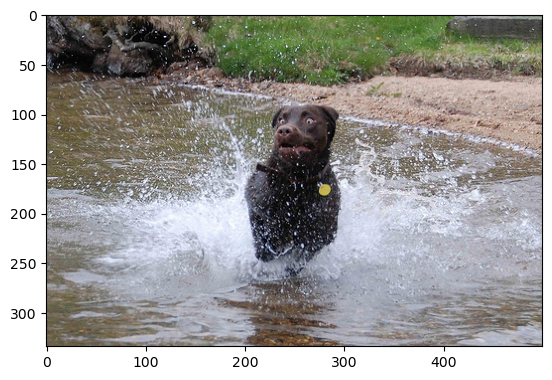

Three dogs in the snow .
1.0


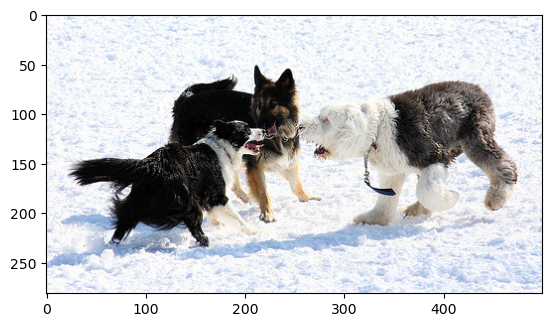

A greyhound wearing a muzzle and the number six on a yellow jacket is running on a dog track .
1.0


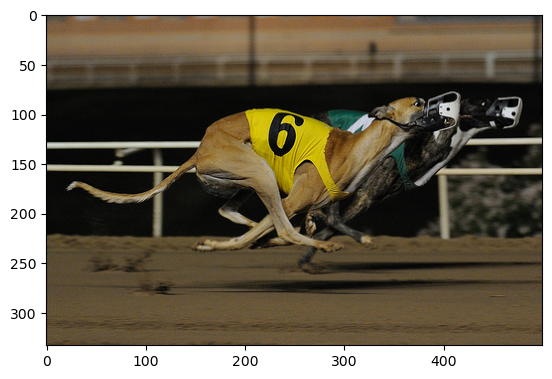

A dog jumps over an obstacle .
1.0


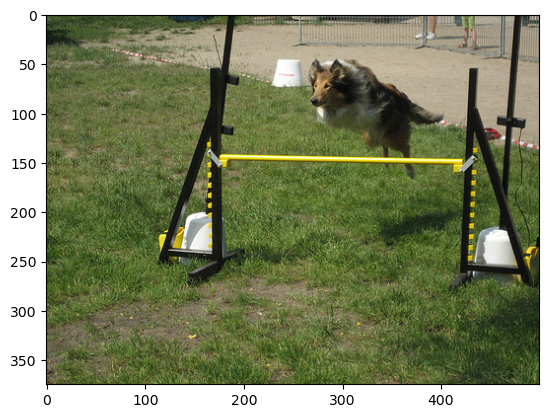

In [45]:
for i in range(len(df_good)):
    print(df_good.loc[i,'query_text'])
    print(df_good.loc[i,'itog'])
    plt.imshow(Image.open(path + '\\train_images\\' + df_good.loc[i,'image']).convert('RGB'))
    plt.show()

В первом приближении все логично

А еще ради интереса посмотрим, что в тестовой выборке

In [48]:
df_test = test_dataset.sample(5)
df_test = df_test.reset_index(drop = True)
df_test

,Unnamed: 0,query_id,query_text,image
0,252,3163198309_bbfe504f0a.jpg#2,One person snowboarding while others look on .,3163198309_bbfe504f0a.jpg
1,362,3482859574_3908de3427.jpg#2,A group of people in anime cosplay costumes .,3482859574_3908de3427.jpg
2,70,2141713971_e25eb12712.jpg#0,A woman and a girl ride a sled down a hill sta...,2141713971_e25eb12712.jpg
3,216,3044745642_1d0784ff29.jpg#1,Men in a khaki-colored tent outside in a rundo...,3044745642_1d0784ff29.jpg
4,340,3455405300_aa3069ecaa.jpg#0,A choir in red uniforms singing in front of a ...,3455405300_aa3069ecaa.jpg


One person snowboarding while others look on .


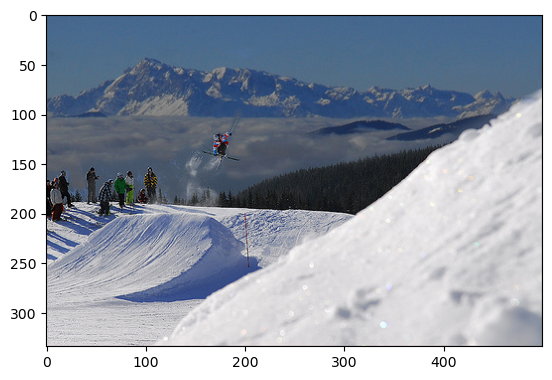

A group of people in anime cosplay costumes .


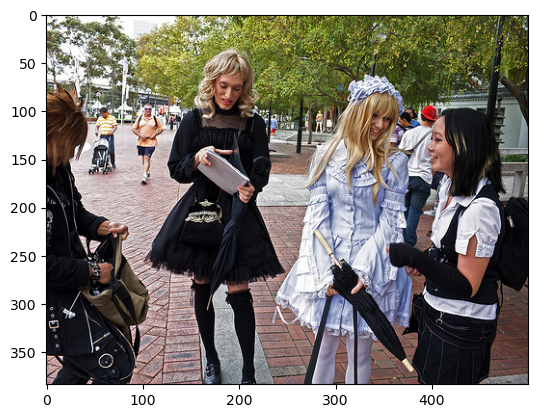

A woman and a girl ride a sled down a hill standing up .


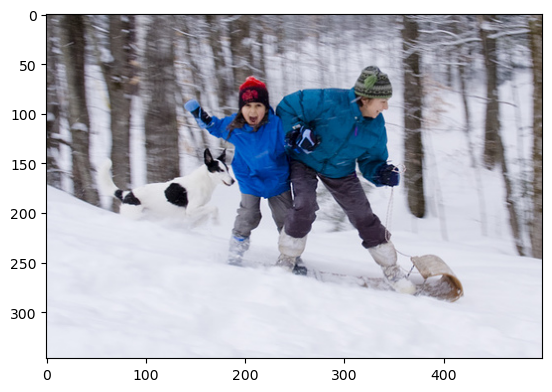

Men in a khaki-colored tent outside in a rundown area .


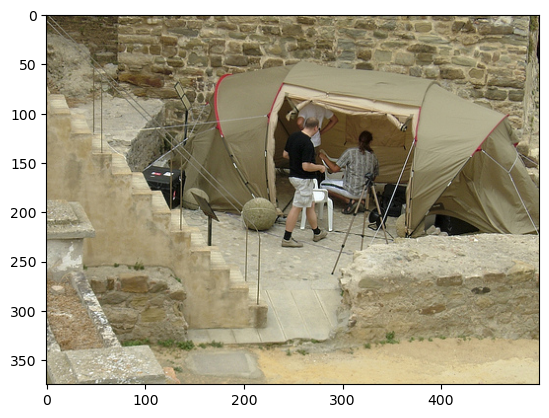

A choir in red uniforms singing in front of a business .


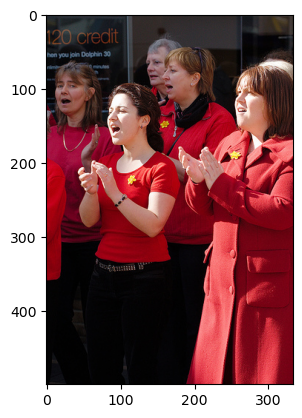

In [49]:
for i in range(len(df_test)):
    print(df_test.loc[i,'query_text'])
    plt.imshow(Image.open(path + '\\test_images\\' + df_test.loc[i,'image']).convert('RGB'))
    plt.show()

Изображение и описание полностью совпадают

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [52]:
resnet = models.resnet18(pretrained=True)

for param in resnet.parameters():
    param.requires_grad_(False) 
    
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules) 

resnet.eval()  

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [53]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
]) 

In [54]:
def vectorize(data_txt_itog, data_img, data_path):
    output_tensor_train = []
    
    for i in tqdm(data_img):   
        img = Image.open(data_path +i).convert('RGB') 
        image_tensor = preprocess(img)
        if len(output_tensor_train) == 0:
            output_tensor_train = pd.DataFrame(resnet(image_tensor.unsqueeze(0)).flatten()).transpose()
        else:
            output_tensor_train = pd.concat([output_tensor_train, pd.DataFrame(resnet(image_tensor.unsqueeze(0)).flatten()).transpose()])

    output_tensor_train = output_tensor_train.reset_index(drop = True)
    cols = []
    for i in output_tensor_train.columns:
        cols.append('img_'+str(i))
    output_tensor_train.columns = cols

    output_tensor_train = pd.concat([data_txt_itog,output_tensor_train], axis = 1)
    
    return output_tensor_train

In [55]:
output_tensor_train = vectorize(train_dataset[['image','query_text','itog']], train_dataset['image'], path + '\\train_images\\')

100%|██████████████████████████████████████████████████████████████████████████████| 4334/4334 [02:00<00:00, 35.96it/s]


In [56]:
output_tensor_train.head()

,image,query_text,itog,img_0,img_1,img_2,img_3,img_4,img_5,img_6,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1056338697_4f7d7ce270.jpg,A man sleeps under a blanket on a city street .,0.083333,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,0.826550,...,0.444238,0.717754,0.294678,0.728789,1.153812,0.750846,1.196695,0.085011,1.056858,0.098236
1,3187395715_f2940c2b72.jpg,A man sleeps under a blanket on a city street .,0.166667,0.272048,2.482059,1.620016,1.238899,1.795413,0.700269,0.333748,...,0.298275,1.009801,0.348864,0.077788,0.595315,1.226461,0.732218,0.455827,1.161827,1.468062
2,463978865_c87c6ca84c.jpg,A man sleeps under a blanket on a city street .,0.150000,0.980667,3.829164,1.296617,0.803800,0.516710,0.409085,0.724091,...,0.126937,0.346220,0.591402,0.638518,0.066458,2.295220,1.183056,0.509245,0.911905,0.558337
3,488590040_35a3e96c89.jpg,A man sleeps under a blanket on a city street .,0.166667,1.519509,1.070953,0.178771,0.297532,0.567791,0.143536,1.374602,...,0.077788,0.677516,2.915013,0.837328,1.224718,1.227888,0.172840,0.541724,4.871027,0.707627
4,534875358_6ea30d3091.jpg,A man sleeps under a blanket on a city street .,0.083333,0.341053,3.860154,1.173058,0.526688,0.542607,0.759330,0.779954,...,0.120271,0.641309,2.622219,2.218602,1.433966,1.789274,1.082459,1.100235,0.101693,0.723263


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


#### Стандартный подход

In [59]:
m = WordNetLemmatizer() 

In [60]:
nltk.download('stopwords')
stopwords = list(set(nltk_stopwords.words('english')))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Igor\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [61]:
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

In [62]:
def text_tokenize(text):
    #tokenized = nltk.word_tokenize(text)
    tokenized =  [m.lemmatize(w, get_wordnet_pos(w)) for w in nltk.word_tokenize(text)]
    joined = ' '.join(tokenized)
    text = re.sub(r'[^a-zA-Z]', ' ', joined)
    text = ' '.join(text.split())
    #text =  [m.lemmatize(w, get_wordnet_pos(w)) for w in nltk.word_tokenize(text)]
    return text

In [63]:
train_dataset=train_dataset.reset_index(drop=True)

In [64]:
txt = text_tokenize(train_dataset['query_text'][0])
txt

'A man sleep under a blanket on a city street'

In [65]:
notebook.tqdm.pandas() 
train_dataset['text_final'] = train_dataset['query_text'].progress_apply(text_tokenize)

  0%|          | 0/4334 [00:00<?, ?it/s]

In [66]:
train_dataset.head()

,image,query_id,query_text,itog,text_final
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.083333,A man sleep under a blanket on a city street
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.166667,A man sleep under a blanket on a city street
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.150000,A man sleep under a blanket on a city street
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.166667,A man sleep under a blanket on a city street
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.083333,A man sleep under a blanket on a city street


In [67]:
#Подгрузка векторизация
count_tf_idf = TfidfVectorizer(stop_words=stopwords)
tf_idf = count_tf_idf.fit_transform(train_dataset['text_final'])

In [68]:
x= tf_idf.toarray()
x[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

Какие-то нули один получились. Попробуем Bert

#### Bert

In [71]:
bert_model = BertModel.from_pretrained('bert-base-uncased',
                                       output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [72]:
def transform_text(column):
    tokenized = column.apply(lambda x: tokenizer.encode(x, add_special_tokens=True))

    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)

    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    
    batch_size = 100
    embeddings = []
    batch_count = padded.shape[0] // batch_size + 1
    for i in tqdm(range(batch_count), disable=batch_count==1):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)]) 
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
        with torch.no_grad():
            batch_embeddings = bert_model(batch, attention_mask=attention_mask_batch)
        
        embeddings.append(batch_embeddings[0][:,0,:].numpy())
    df = np.concatenate(embeddings)
    df = pd.DataFrame(df)

    cols = []
    for i in df.columns:
        cols.append('txt_'+str(i))
    df.columns = cols
    
    return df

In [73]:
train_dataset['query_text']

0         A man sleeps under a blanket on a city street .
1         A man sleeps under a blanket on a city street .
2         A man sleeps under a blanket on a city street .
3         A man sleeps under a blanket on a city street .
4         A man sleeps under a blanket on a city street .
                              ...                        
4329    A small animal leaps behind a larger animal , ...
4330            a old man walks down the uncrowded road .
4331         A dog stands on the side of a grassy cliff .
4332                         A blurry photo of two dogs .
4333                          A man rows his boat below .
Name: query_text, Length: 4334, dtype: object

In [74]:
text_features = transform_text(train_dataset['query_text'])
text_features.shape

100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [01:36<00:00,  2.19s/it]


(4334, 768)

In [75]:
text_features.head(10)

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
1,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
2,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
4,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
5,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,-0.298645,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
6,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,-0.298645,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
7,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,-0.298645,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
8,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,-0.298645,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
9,-0.368424,-0.235774,-0.305801,0.175350,0.182789,-0.072999,0.053588,1.238183,-0.730164,-0.333559,...,0.186065,-0.355032,-0.142533,0.475379,0.240220,-0.005223,-0.248848,-0.535117,0.498605,0.076596


In [76]:
text_features = pd.concat([train_dataset[['image','query_text','itog']],text_features], axis = 1)
text_features.head(10)

,image,query_text,itog,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,1056338697_4f7d7ce270.jpg,A man sleeps under a blanket on a city street .,0.083333,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
1,3187395715_f2940c2b72.jpg,A man sleeps under a blanket on a city street .,0.166667,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
2,463978865_c87c6ca84c.jpg,A man sleeps under a blanket on a city street .,0.150000,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,488590040_35a3e96c89.jpg,A man sleeps under a blanket on a city street .,0.166667,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
4,534875358_6ea30d3091.jpg,A man sleeps under a blanket on a city street .,0.083333,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
5,1056338697_4f7d7ce270.jpg,A woman plays with long red ribbons in an empt...,0.166667,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
6,3208074567_ac44aeb3f3.jpg,A woman plays with long red ribbons in an empt...,0.000000,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
7,3251976937_20625dc2b8.jpg,A woman plays with long red ribbons in an empt...,0.000000,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
8,370713359_7560808550.jpg,A woman plays with long red ribbons in an empt...,0.000000,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313
9,1056338697_4f7d7ce270.jpg,Chinese market street in the winter time .,0.083333,-0.368424,-0.235774,-0.305801,0.175350,0.182789,-0.072999,0.053588,...,0.186065,-0.355032,-0.142533,0.475379,0.240220,-0.005223,-0.248848,-0.535117,0.498605,0.076596


Вроде поинтереснее

## 5. Объединение векторов

In [79]:
text_features.iloc[:,3:]

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
1,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
2,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
4,0.225946,-0.147770,-0.410427,0.009857,0.024526,-0.012760,-0.160295,1.200931,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4329,-0.202393,0.010949,-0.600034,0.026460,-0.149480,-0.436055,0.202768,0.346282,-0.341368,-0.140822,...,-0.476260,0.482566,-0.157686,0.238350,-0.085962,0.502554,0.380311,-0.003462,0.230403,0.656286
4330,0.449086,0.662357,-0.141891,-0.228080,-0.038223,-0.525846,0.450759,0.406852,-0.104059,-0.767432,...,-0.414394,0.328929,0.030829,-0.149467,-0.202598,0.619799,-0.179289,-0.117864,0.284214,0.372084
4331,-0.081584,0.053984,-0.822275,-0.045248,0.026900,-0.230824,0.049381,0.905659,-0.463468,-0.148046,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196773,-0.205707,0.363054,0.261026
4332,-0.523560,-0.274708,-0.815773,0.164703,-0.087568,-0.247899,-0.459987,0.687411,-0.122619,-0.105064,...,0.094444,0.030622,-0.130709,-0.162981,-0.088953,-0.035340,-0.393786,-0.147369,0.118898,0.067568


In [80]:
uni = pd.concat([output_tensor_train,text_features.iloc[:,3:]], axis = 1)
uni.head()

,image,query_text,itog,img_0,img_1,img_2,img_3,img_4,img_5,img_6,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,1056338697_4f7d7ce270.jpg,A man sleeps under a blanket on a city street .,0.083333,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,0.826550,...,-0.11307,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
1,3187395715_f2940c2b72.jpg,A man sleeps under a blanket on a city street .,0.166667,0.272048,2.482059,1.620016,1.238899,1.795413,0.700269,0.333748,...,-0.11307,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
2,463978865_c87c6ca84c.jpg,A man sleeps under a blanket on a city street .,0.150000,0.980667,3.829164,1.296617,0.803800,0.516710,0.409085,0.724091,...,-0.11307,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,488590040_35a3e96c89.jpg,A man sleeps under a blanket on a city street .,0.166667,1.519509,1.070953,0.178771,0.297532,0.567791,0.143536,1.374602,...,-0.11307,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
4,534875358_6ea30d3091.jpg,A man sleeps under a blanket on a city street .,0.083333,0.341053,3.860154,1.173058,0.526688,0.542607,0.759330,0.779954,...,-0.11307,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055


## 6. Обучение модели предсказания соответствия

In [82]:
RANDOM_STATE=42

In [83]:
X = uni.drop(['query_text','itog', 'image'], axis = 1)
y = uni['itog']

In [84]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)

In [85]:
train_indices, test_indices = next(gss.split(X, y, groups=uni['image']))

In [86]:
X_train = X.iloc[train_indices, :]
X_test = X.iloc[test_indices, :]
y_train = y.iloc[train_indices]
y_test = y.iloc[test_indices]

In [87]:
X_train.shape

(3016, 1280)

In [88]:
X_train.head()

,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,img_8,img_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,0.826550,1.108058,0.169696,0.365278,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
2,0.980667,3.829164,1.296617,0.803800,0.516710,0.409085,0.724091,0.838845,0.244295,0.396823,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,1.519509,1.070953,0.178771,0.297532,0.567791,0.143536,1.374602,0.297599,0.276965,0.112594,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
4,0.341053,3.860154,1.173058,0.526688,0.542607,0.759330,0.779954,0.009413,0.828653,0.141454,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
5,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,0.826550,1.108058,0.169696,0.365278,...,-0.033179,0.282282,-0.214147,0.347063,0.388013,0.896650,0.471117,-0.301246,0.148654,0.346313


In [89]:
y_train.shape

(3016,)

In [90]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Строим модель

#### Линейная регрессия

In [93]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [94]:
prediction = lr_model.predict(X_test)

In [95]:
rmse = mean_squared_error(y_test, prediction) ** 0.5
rmse

179.65825303947938

Многовато

#### CatBoost

In [98]:
train_pool = catboost.Pool(X_train, y_train)
val_pool = catboost.Pool(X_test, y_test)
cb_model = catboost.CatBoostRegressor(eval_metric='RMSE', verbose=100, random_seed=RANDOM_STATE)
cb_model.fit(train_pool, eval_set=val_pool, early_stopping_rounds=150)

Learning rate set to 0.060557
0:	learn: 0.2636716	test: 0.2564123	best: 0.2564123 (0)	total: 230ms	remaining: 3m 50s
100:	learn: 0.1959107	test: 0.2367426	best: 0.2366703 (99)	total: 7.47s	remaining: 1m 6s
200:	learn: 0.1570459	test: 0.2328754	best: 0.2328754 (200)	total: 14.8s	remaining: 58.8s
300:	learn: 0.1272503	test: 0.2310345	best: 0.2310345 (300)	total: 22.1s	remaining: 51.3s
400:	learn: 0.1033559	test: 0.2303242	best: 0.2302310 (381)	total: 29.2s	remaining: 43.7s
500:	learn: 0.0868060	test: 0.2297550	best: 0.2296969 (497)	total: 36.3s	remaining: 36.1s
600:	learn: 0.0726685	test: 0.2296678	best: 0.2296678 (600)	total: 43.3s	remaining: 28.8s
700:	learn: 0.0622966	test: 0.2293685	best: 0.2293685 (700)	total: 50.7s	remaining: 21.6s
800:	learn: 0.0532371	test: 0.2292903	best: 0.2292307 (730)	total: 57.7s	remaining: 14.3s
900:	learn: 0.0452830	test: 0.2293343	best: 0.2291634 (818)	total: 1m 4s	remaining: 7.11s
999:	learn: 0.0388605	test: 0.2291909	best: 0.2291197 (955)	total: 1m 11s	

Явно лучше.

## 7. Тестирование модели

In [100]:
#test_dataset = test_dataset['image'].drop_duplicates()
len(test_dataset)

500

In [101]:
test_dataset = test_dataset.reset_index(drop = True)
test_dataset = test_dataset.drop(['Unnamed: 0'], axis = 1)
test_dataset.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [102]:
preview_df = test_dataset.sample(20, random_state=RANDOM_STATE)
preview_df = preview_df.reset_index(drop = True)
preview_df

,query_id,query_text,image
0,3482859574_3908de3427.jpg#1,A group of girls who are gothically dressed st...,3482859574_3908de3427.jpg
1,2141713971_e25eb12712.jpg#3,A woman and girl riding downhill on a sled wit...,2141713971_e25eb12712.jpg
2,3488087117_2719647989.jpg#4,The dog is running .,3488087117_2719647989.jpg
3,269650644_059a84ece5.jpg#0,A group of people are ice skating in a big city .,269650644_059a84ece5.jpg
4,2428094795_d3a8f46046.jpg#4,Little kid in blue coat and hat riding a tricy...,2428094795_d3a8f46046.jpg
5,3553476195_fb3747d7c1.jpg#4,Two black dogs fighting over an orange toy .,3553476195_fb3747d7c1.jpg
6,3514297698_0512623955.jpg#2,A dog jumping for a tennis ball near an ocean,3514297698_0512623955.jpg
7,2505056124_1276e8dbcb.jpg#4,Boy flying a distant kite .,2505056124_1276e8dbcb.jpg
8,2121140070_a09644550b.jpg#3,kids play ultimate Frisbee .,2121140070_a09644550b.jpg
9,607339469_af851c4119.jpg#0,A girl in a purple shirt feeding ducks,607339469_af851c4119.jpg


Суть:
- векторизируем текст 1-ого запроса (TXT_1)
- векторизируем каждое тестовое изображение (IMG_i)
- соединияем два вектора (TXT_1 + IMG_1; TXT_1 + IMG_2...)
- получаем предсказательную метрику для каждого соединения
- вычисляем максимальную предсказательную метрику, исходя из чего определяем IMG_?  

#### Векторизируем тестовые изображения

In [105]:
output_tensor_test = vectorize(test_dataset[['image','query_text']], test_dataset['image'], path + '\\test_images\\')

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 35.88it/s]


In [106]:
output_tensor_test.head()

,image,query_text,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1177994172_10d143cb8d.jpg,"Two blonde boys , one in a camouflage shirt an...",0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107
1,1177994172_10d143cb8d.jpg,Two boys are squirting water guns at each other .,0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107
2,1177994172_10d143cb8d.jpg,Two boys spraying each other with water,0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107
3,1177994172_10d143cb8d.jpg,Two children wearing jeans squirt water at eac...,0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107
4,1177994172_10d143cb8d.jpg,Two young boys are squirting water at each oth...,0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107


In [107]:
img = output_tensor_test.drop(['query_text'],axis = 1)

In [108]:
img = img.drop_duplicates()

In [109]:
img = img.reset_index(drop = True)
img

,image,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,img_8,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1177994172_10d143cb8d.jpg,0.443963,2.334486,0.006339,2.394353,0.022514,0.329740,1.683887,1.900140,0.215906,...,0.141606,0.323036,1.905803,1.066337,0.000000,2.231437,2.022537,2.292717,0.793585,0.850107
1,1232148178_4f45cc3284.jpg,0.838445,1.568587,1.886732,2.837503,0.734879,0.470229,0.823981,1.701098,1.028144,...,2.110206,0.119371,0.799624,1.104447,1.747199,0.424487,0.182695,1.534220,1.347147,0.404173
2,123997871_6a9ca987b1.jpg,0.443766,0.826596,1.753989,1.080988,0.542635,0.970872,0.315569,0.813558,1.350496,...,0.700834,0.281531,2.178857,1.093008,0.865928,1.917954,2.054578,1.667658,1.023103,1.039767
3,1319634306_816f21677f.jpg,0.335738,0.291324,1.498222,0.186021,0.180829,0.099376,1.703927,1.509952,0.905085,...,0.335948,0.649706,0.139001,0.785381,0.806341,0.243199,0.270097,0.894144,0.454314,0.001899
4,1429546659_44cb09cbe2.jpg,0.189787,1.876468,0.825718,0.621149,2.310625,0.565720,0.033543,0.556440,0.402366,...,0.879860,0.729771,0.114588,0.915989,0.860376,1.078615,0.487137,1.073111,0.847126,0.025273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,862177617_c2c0581075.jpg,0.174524,1.375232,0.119083,0.174163,0.712794,1.601113,0.210432,0.179840,0.831183,...,4.605904,0.217464,2.224442,0.143745,1.159092,1.171775,0.600913,0.675405,0.584987,2.085648
96,957682378_46c3b07bcd.jpg,1.069744,0.771171,0.341688,0.375700,2.558996,0.445200,0.232577,0.771112,0.493516,...,1.228008,0.120358,0.532284,1.419850,0.814216,0.036498,0.113880,0.600678,0.450686,0.634381
97,973827791_467d83986e.jpg,1.315215,0.279087,0.035967,2.330516,0.851567,0.166064,0.927876,1.106319,0.271883,...,0.487449,0.105593,1.807399,0.118968,0.009201,1.034906,0.384165,1.183896,1.911391,0.981314
98,989754491_7e53fb4586.jpg,0.447236,0.701174,1.468316,3.300116,0.136344,0.333052,0.668021,1.221872,0.707509,...,0.008882,0.848696,0.978793,0.061583,0.965579,0.483451,0.706645,0.366856,1.108907,0.707110


In [125]:
clean_img = img[['image']]

#### Векторизируем отобранные запросы

In [111]:
txt = transform_text(preview_df['query_text'])

In [112]:
txt

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,0.074639,0.235124,-0.204586,-0.123885,0.041095,-0.295158,0.171149,0.582179,-0.325111,-0.412328,...,0.025188,-0.762697,-0.029581,-0.176724,0.146970,0.449529,0.065627,-0.404201,0.159027,-0.073008
1,-0.150228,0.220070,-0.850217,0.140400,0.282217,0.198176,-0.257653,0.815356,-0.400031,-0.148103,...,0.109472,-0.449807,-0.255602,-0.027580,0.513556,0.511044,-0.224460,-0.093383,0.551413,-0.268463
2,-0.226509,0.443175,-0.127744,-0.680654,-0.365977,-0.523919,0.480532,0.539455,-0.408122,-0.427675,...,-0.196886,0.175857,0.020750,0.106129,-0.060143,0.237154,0.223895,-0.309667,0.183383,0.338345
3,0.156525,0.311493,-0.137952,0.018006,0.087205,-0.524518,0.517246,1.078908,-0.195551,-0.641093,...,-0.163942,-0.426381,0.039306,-0.232459,-0.180124,1.240527,-0.072638,-0.588989,0.175660,0.322412
4,-0.432862,-0.400220,-0.670952,0.236793,-0.067740,-0.228491,-0.084647,1.164283,-0.716194,-0.101213,...,-0.407950,0.027355,-0.383765,0.114510,0.519886,-0.089184,-0.671133,-0.484274,0.539665,-0.037335
5,-0.215822,-0.400434,-1.177927,0.194630,0.157046,-0.330892,-0.406061,1.011970,-0.598239,0.009090,...,-0.053283,0.140031,-0.292372,-0.199478,0.334621,-0.125899,-0.097054,-0.087374,0.273298,0.116888
6,-0.149071,-0.168525,-0.860660,0.421787,0.502475,-0.020920,-0.050117,0.985670,-0.620937,-0.165641,...,0.087590,-0.397647,-0.101131,0.226311,0.449322,0.291179,0.092936,-0.349495,-0.002856,0.048660
7,-0.373504,-0.462073,-0.613215,0.028714,-0.131911,-0.358415,-0.030660,1.043360,-0.584672,0.175554,...,0.163730,0.070326,-0.059432,0.038230,0.383421,0.191209,-0.524292,-0.296842,0.335050,0.513469
8,0.009074,-0.140567,0.049930,0.238593,-0.245384,-0.864377,0.406772,1.091531,-0.178576,-0.161795,...,-0.217739,0.184365,-0.128964,0.097167,0.133805,-0.104377,-0.200519,-0.434753,0.733706,0.184451
9,-0.148448,-0.228958,-0.718341,0.373034,-0.007773,-0.038824,-0.358707,0.957023,-0.496616,-0.222271,...,-0.104610,0.054572,-0.037305,0.184934,0.405466,0.343640,-0.360191,0.156844,0.267476,0.087642


In [113]:
txt_full = pd.concat([preview_df[['query_text']],txt], axis = 1)
txt_full.head(10)

,query_text,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,A group of girls who are gothically dressed st...,0.074639,0.235124,-0.204586,-0.123885,0.041095,-0.295158,0.171149,0.582179,-0.325111,...,0.025188,-0.762697,-0.029581,-0.176724,0.146970,0.449529,0.065627,-0.404201,0.159027,-0.073008
1,A woman and girl riding downhill on a sled wit...,-0.150228,0.220070,-0.850217,0.140400,0.282217,0.198176,-0.257653,0.815356,-0.400031,...,0.109472,-0.449807,-0.255602,-0.027580,0.513556,0.511044,-0.224460,-0.093383,0.551413,-0.268463
2,The dog is running .,-0.226509,0.443175,-0.127744,-0.680654,-0.365977,-0.523919,0.480532,0.539455,-0.408122,...,-0.196886,0.175857,0.020750,0.106129,-0.060143,0.237154,0.223895,-0.309667,0.183383,0.338345
3,A group of people are ice skating in a big city .,0.156525,0.311493,-0.137952,0.018006,0.087205,-0.524518,0.517246,1.078908,-0.195551,...,-0.163942,-0.426381,0.039306,-0.232459,-0.180124,1.240527,-0.072638,-0.588989,0.175660,0.322412
4,Little kid in blue coat and hat riding a tricy...,-0.432862,-0.400220,-0.670952,0.236793,-0.067740,-0.228491,-0.084647,1.164283,-0.716194,...,-0.407950,0.027355,-0.383765,0.114510,0.519886,-0.089184,-0.671133,-0.484274,0.539665,-0.037335
5,Two black dogs fighting over an orange toy .,-0.215822,-0.400434,-1.177927,0.194630,0.157046,-0.330892,-0.406061,1.011970,-0.598239,...,-0.053283,0.140031,-0.292372,-0.199478,0.334621,-0.125899,-0.097054,-0.087374,0.273298,0.116888
6,A dog jumping for a tennis ball near an ocean,-0.149071,-0.168525,-0.860660,0.421787,0.502475,-0.020920,-0.050117,0.985670,-0.620937,...,0.087590,-0.397647,-0.101131,0.226311,0.449322,0.291179,0.092936,-0.349495,-0.002856,0.048660
7,Boy flying a distant kite .,-0.373504,-0.462073,-0.613215,0.028714,-0.131911,-0.358415,-0.030660,1.043360,-0.584672,...,0.163730,0.070326,-0.059432,0.038230,0.383421,0.191209,-0.524292,-0.296842,0.335050,0.513469
8,kids play ultimate Frisbee .,0.009074,-0.140567,0.049930,0.238593,-0.245384,-0.864377,0.406772,1.091531,-0.178576,...,-0.217739,0.184365,-0.128964,0.097167,0.133805,-0.104377,-0.200519,-0.434753,0.733706,0.184451
9,A girl in a purple shirt feeding ducks,-0.148448,-0.228958,-0.718341,0.373034,-0.007773,-0.038824,-0.358707,0.957023,-0.496616,...,-0.104610,0.054572,-0.037305,0.184934,0.405466,0.343640,-0.360191,0.156844,0.267476,0.087642


In [119]:
img.iloc[0:1,1:]

,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,img_8,img_9,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,0.443963,2.334486,0.006339,2.394353,0.022514,0.32974,1.683887,1.90014,0.215906,0.0335,...,0.141606,0.323036,1.905803,1.066337,0.0,2.231437,2.022537,2.292717,0.793585,0.850107


#### Тестируем

In [135]:
def checking(txt, img):
    txt['query_text'] = txt['query_text'].str.lower()
    if len(txt.loc[txt['query_text'].str.contains('|'.join(exclude_words))]):
        print('This image is unavailable in your country in compliance with local laws.')
        return
    else:
        print(txt['query_text'])
        txt = txt.drop('query_text',axis=1)
        

    df_full = []
    for i in range(len(img)):
        df = pd.concat([img.iloc[i:i+1,1:].reset_index(drop=True),txt.reset_index(drop=True)], axis=1)
        if len(df_full) == 0:
            df_full = df
        else:
            df_full = pd.concat([df_full,df])
    df_full = df_full.reset_index(drop=True)
    test_features = scaler.transform(df_full)
    predictions = cb_model.predict(test_features)
    best_idx = np.argmax(predictions)
    plt.imshow(Image.open(path + '\\test_images\\' + clean_img.loc[best_idx,'image']).convert('RGB'))
    plt.show()

    #return df_full

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
2    the dog is running .
Name: query_text, dtype: object


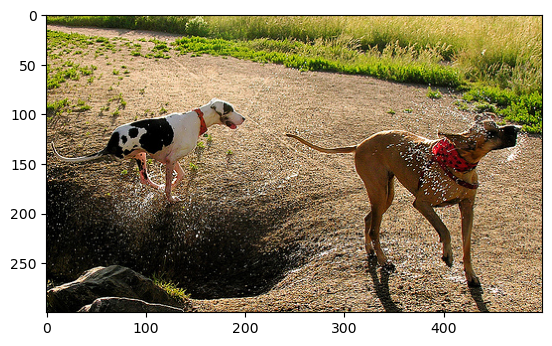

3    a group of people are ice skating in a big city .
Name: query_text, dtype: object


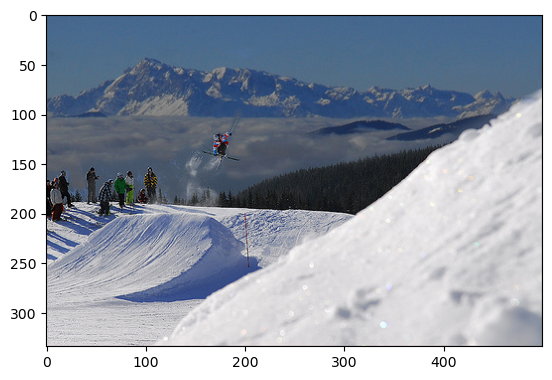

This image is unavailable in your country in compliance with local laws.
5    two black dogs fighting over an orange toy .
Name: query_text, dtype: object


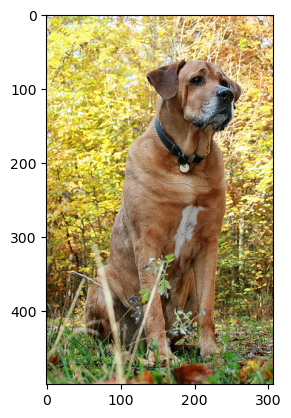

6    a dog jumping for a tennis ball near an ocean
Name: query_text, dtype: object


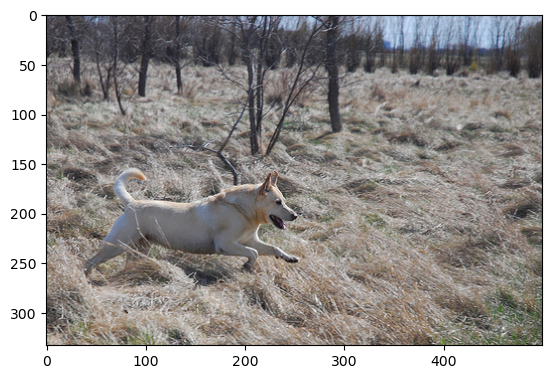

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
11    the brown german shepherd dog is playing with ...
Name: query_text, dtype: object


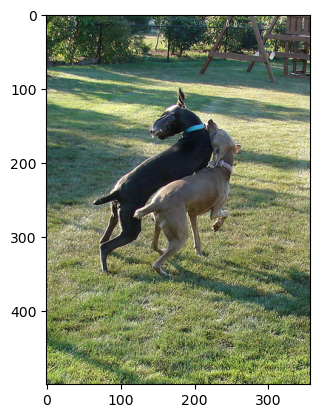

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
14    a little white dog in running on the sidewalk .
Name: query_text, dtype: object


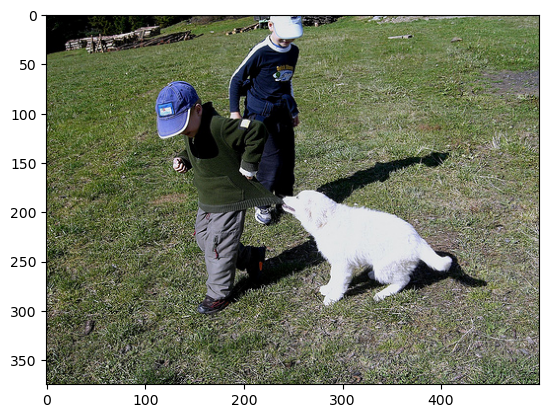

15    two people sit on a park bench .
Name: query_text, dtype: object


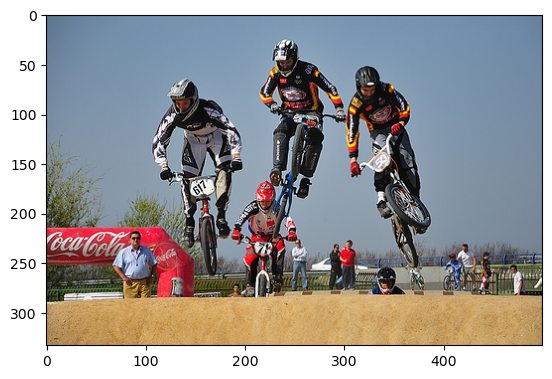

16    a black dog has a dumbbell in his mouth .
Name: query_text, dtype: object


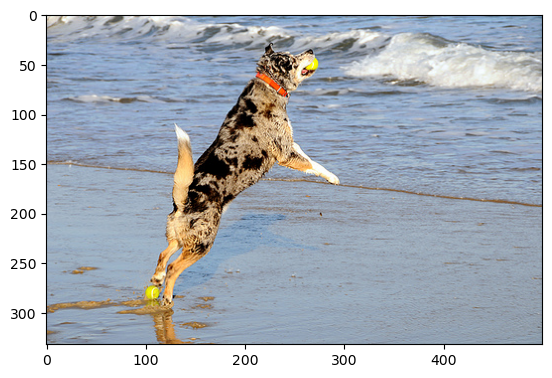

This image is unavailable in your country in compliance with local laws.
18    a group of people perform together onstage .
Name: query_text, dtype: object


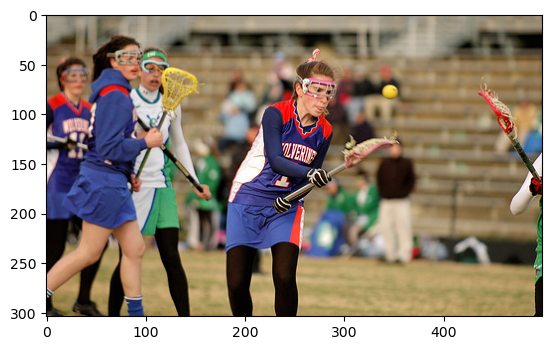

This image is unavailable in your country in compliance with local laws.


In [137]:
for i in range(len(txt_full)):
    x = txt_full.iloc[i:i+1, :]
    checking(x,img)

В первом приближении моделька худо-бедно выдает подходящие результаты